In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!git clone https://github.com/meituan/YOLOv6.git
%cd YOLOv6
%pip install -r requirements.txt

Cloning into 'YOLOv6'...
remote: Enumerating objects: 2727, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 2727 (delta 4), reused 0 (delta 0), pack-reused 2713
Receiving objects: 100% (2727/2727), 34.95 MiB | 17.49 MiB/s, done.
Resolving deltas: 100% (1536/1536), done.
/content/YOLOv6
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 77.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 88.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 49.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 67.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 KB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 11.6 

In [3]:
#Change dir to clone yolov5 dir
%cd /content/YOLOv6


/content/YOLOv6


In [4]:
# install dependencies as necessary
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.downloads import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [5]:
%cd /content/yolov6
!unzip '/content/drive/MyDrive/roboflow dataset(yolov6).zip'

[Errno 2] No such file or directory: '/content/yolov6'
/content/YOLOv6
Archive:  /content/drive/MyDrive/roboflow dataset(yolov6).zip
  inflating: roboflow dataset(yolov6)/data.yaml  
  inflating: roboflow dataset(yolov6)/data_cleaning.ipynb  
   creating: roboflow dataset(yolov6)/images/
   creating: roboflow dataset(yolov6)/images/test/
  inflating: roboflow dataset(yolov6)/images/test/bio0000_frame0000212_jpg.rf.bef7925851d53558b09dd82fc027a891.jpg  
  inflating: roboflow dataset(yolov6)/images/test/bio0001_frame0000023_jpg.rf.15297487b07a40584dd91d35fdddfcc6.jpg  
  inflating: roboflow dataset(yolov6)/images/test/bio0001_frame0000103_jpg.rf.c63b07d312cf2588374024dd216e9f1c.jpg  
  inflating: roboflow dataset(yolov6)/images/test/bio0001_frame0000123_jpg.rf.161249157c45e2458c411695ff94ed39.jpg  
  inflating: roboflow dataset(yolov6)/images/test/bio0001_frame0000332_jpg.rf.a19e0df3fe949682a27c8d10132074d4.jpg  
  inflating: roboflow dataset(yolov6)/images/test/bio0001_frame0000414_jpg.

MANUALLY MOVE THE DATA.YAML INTO THE YOLOV6 DATA DIR


In [7]:
import glob
my_list = []
for file in glob.glob(r'/content/YOLOv6/roboflow dataset(yolov6)/labels/test/*.txt'): 

    with open(file) as f:
        lines = f.readlines()
        
        for line in lines:
            my_list.append(line)

#101373 test
#111133 train

In [8]:
for i in range(0,len(my_list)):
    my_list[i]=int(my_list[i][0])
len(my_list)

147

In [9]:
count=0
for i in range(len(my_list)):
  if(my_list[i] not in [0,1,2]):
    count+=1
count

0

FIRST MOVE THE DATA.YAML INTO THE DATA DIR


In [6]:
# define number of classes based on YAML
import yaml
with open('/content/YOLOv6/data/data.yaml', 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

FileNotFoundError: ignored

In [ ]:
num_classes

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
!python tools/train.py --batch 16 --conf configs/yolov6s.py --data data/data.yaml --output-dir '/content/drive/MyDrive/!checkpoints'

Using 1 GPU for training... 
training args are: Namespace(batch_size=16, bs_per_gpu=32, calib=False, check_images=False, check_labels=False, conf_file='configs/yolov6s.py', data_path='data/data.yaml', device='0', dist_url='env://', distill=False, distill_feat=False, epochs=400, eval_final_only=False, eval_interval=20, fuse_ab=False, gpu_count=0, heavy_eval_range=50, img_size=640, local_rank=-1, name='exp', output_dir='/content/drive/MyDrive/!checkpoints', quant=False, rank=-1, resume=False, save_ckpt_on_last_n_epoch=-1, save_dir='/content/drive/MyDrive/!checkpoints/exp', stop_aug_last_n_epoch=15, teacher_model_path=None, temperature=20, workers=8, world_size=1, write_trainbatch_tb=False)

Train: Checking formats of images with 2 process(es): 
0 image(s) corrupted: 100% 1742/1742 [00:00<00:00, 3676.14it/s]
Train: Checking formats of labels with 2 process(es): 
1742 label(s) found, 0 label(s) missing, 123 label(s) empty, 0 invalid label files: 100% 1742/1742 [00:00<00:00, 3499.78it/s]
Tr

In [9]:
!python tools/eval.py --weights /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt --data data/data.yaml 

Namespace(batch_size=32, conf_thres=0.03, config_file='', data='data/data.yaml', device='0', do_coco_metric=True, do_pr_metric=False, eval_config_file='./configs/experiment/eval_640_repro.py', force_no_pad=False, half=False, img_size=640, iou_thres=0.65, letterbox_return_int=False, name='exp', not_infer_on_rect=False, plot_confusion_matrix=False, plot_curve=True, reproduce_640_eval=False, save_dir='runs/val/', scale_exact=False, task='val', test_load_size=640, verbose=False, weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt')
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Switch model to deploy modality.
Mo

In [13]:
!python tools/infer.py \
--weights /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt  \
--yaml data/data.yaml \
--source /content/drive/MyDrive/manythings.mp4 \
--name v6n_video_infer \
--view-img

Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='v6n_video_infer', not_save_img=False, project='runs/inference', save_dir=None, save_txt=False, source='/content/drive/MyDrive/manythings.mp4', view_img=True, webcam=False, webcam_addr='0', weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt', yaml='data/data.yaml')
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Traceback (most recent call last):
  File "tools/infer.py", line 120, in <module>
    main(ar

In [22]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/!checkpoints

<IPython.core.display.Javascript object>

In [23]:
!pip install imgaug==0.4.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [24]:
# trained weights are saved by default in our weights folder
%ls /content/drive/MyDrive/!checkpoints/

exp/


In [29]:
!python tools/eval.py --weights /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt --source '/content/YOLOv6/roboflow dataset(yolov6)/images/test' 

usage: eval.py
       [-h]
       [--data DATA]
       [--weights WEIGHTS]
       [--batch-size BATCH_SIZE]
       [--img-size IMG_SIZE]
       [--conf-thres CONF_THRES]
       [--iou-thres IOU_THRES]
       [--task TASK]
       [--device DEVICE]
       [--half]
       [--save_dir SAVE_DIR]
       [--name NAME]
       [--test_load_size TEST_LOAD_SIZE]
       [--letterbox_return_int]
       [--scale_exact]
       [--force_no_pad]
       [--not_infer_on_rect]
       [--reproduce_640_eval]
       [--eval_config_file EVAL_CONFIG_FILE]
       [--do_coco_metric DO_COCO_METRIC]
       [--do_pr_metric DO_PR_METRIC]
       [--plot_curve PLOT_CURVE]
       [--plot_confusion_matrix]
       [--verbose]
       [--config-file CONFIG_FILE]
eval.py: error: unrecognized arguments: --source /content/YOLOv6/roboflow dataset(yolov6)/images/test


In [31]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/YOLOv6
!python tools/infer.py --weights '/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt' --source '/content/YOLOv6/roboflow dataset(yolov6)/images/test' --yaml /content/YOLOv6/data/data.yaml

/content/YOLOv6
Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', not_save_img=False, project='runs/inference', save_dir=None, save_txt=False, source='/content/YOLOv6/roboflow dataset(yolov6)/images/test', view_img=False, webcam=False, webcam_addr='0', weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt', yaml='/content/YOLOv6/data/data.yaml')
Save directory already existed
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 107/107 [00:02<00:00,

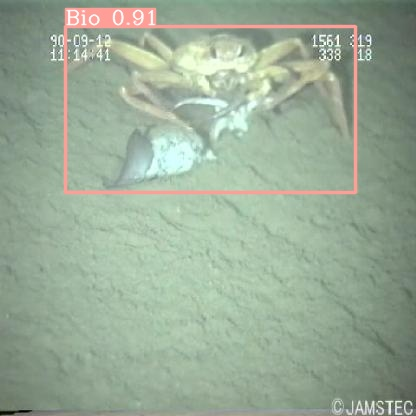

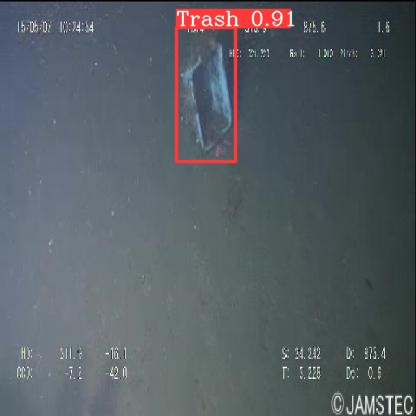

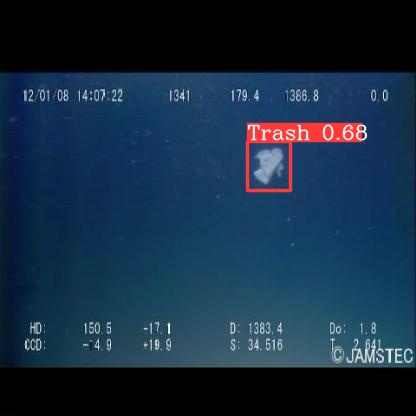

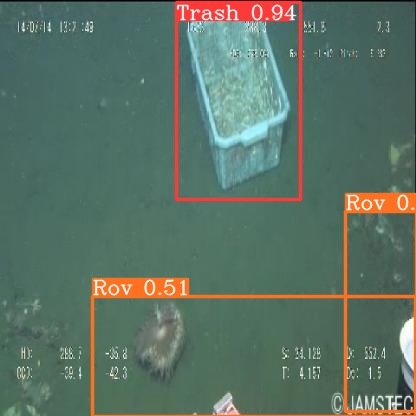

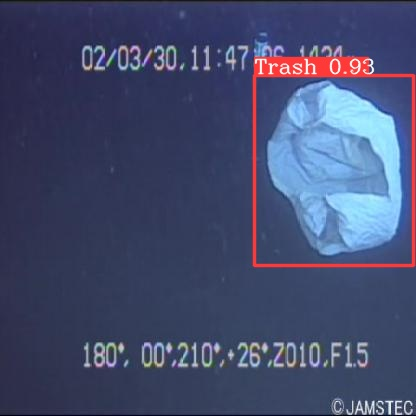

...

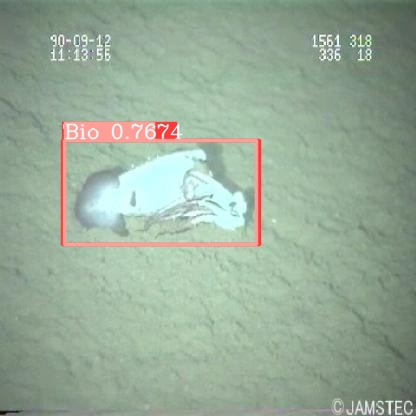

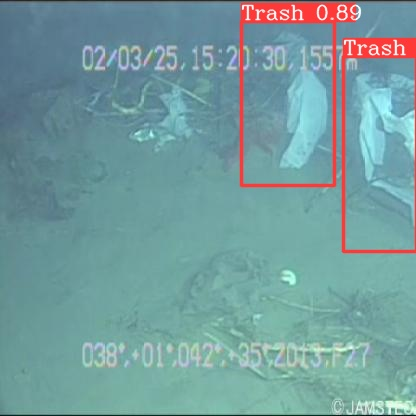

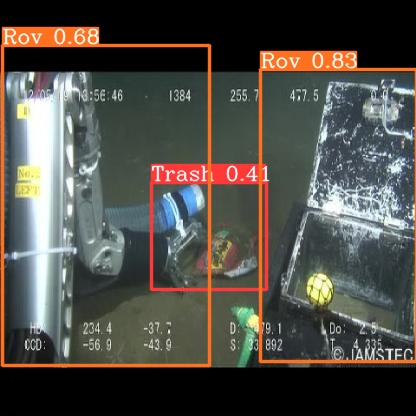

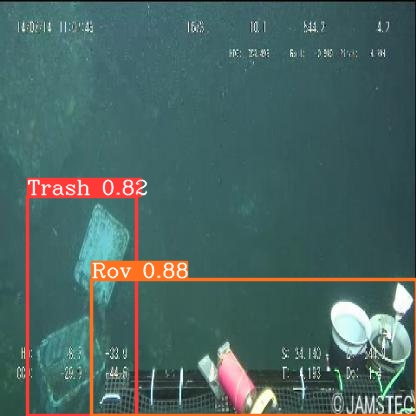

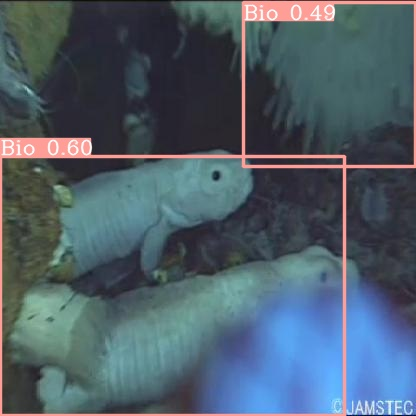

In [32]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/YOLOv6/runs/inference/exp/test/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [33]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/YOLOv6
!python tools/infer.py --weights '/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt' --source '/content/drive/MyDrive/!checkpoints/exp/weights/manythings.mp4' --yaml /content/YOLOv6/data/data.yaml

/content/YOLOv6
Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', not_save_img=False, project='runs/inference', save_dir=None, save_txt=False, source='/content/drive/MyDrive/!checkpoints/exp/weights/manythings.mp4', view_img=False, webcam=False, webcam_addr='0', weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt', yaml='/content/YOLOv6/data/data.yaml')
Save directory already existed
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
1167it [00:20, 5

In [34]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/YOLOv6
!python tools/infer.py --weights '/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt' --source '/content/drive/MyDrive/!checkpoints/exp/weights/several.mp4' --yaml /content/YOLOv6/data/data.yaml

/content/YOLOv6
Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', not_save_img=False, project='runs/inference', save_dir=None, save_txt=False, source='/content/drive/MyDrive/!checkpoints/exp/weights/several.mp4', view_img=False, webcam=False, webcam_addr='0', weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt', yaml='/content/YOLOv6/data/data.yaml')
Save directory already existed
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
1130it [00:19, 58.9

In [35]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/YOLOv6
!python tools/infer.py --weights '/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt' --source '/content/drive/MyDrive/!checkpoints/exp/weights/bali.mp4' --yaml /content/YOLOv6/data/data.yaml

/content/YOLOv6
Namespace(agnostic_nms=False, classes=None, conf_thres=0.4, device='0', half=False, hide_conf=False, hide_labels=False, img_size=[640, 640], iou_thres=0.45, max_det=1000, name='exp', not_save_img=False, project='runs/inference', save_dir=None, save_txt=False, source='/content/drive/MyDrive/!checkpoints/exp/weights/bali.mp4', view_img=False, webcam=False, webcam_addr='0', weights='/content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt', yaml='/content/YOLOv6/data/data.yaml')
Save directory already existed
Loading checkpoint from /content/drive/MyDrive/!checkpoints/exp/weights/best_ckpt.pt

Fusing model...
Switch model to deploy modality.
/usr/local/lib/python3.8/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
4615it [01:53, 40.51it

In [36]:
%cp /content/YOLOv6/runs/inference/exp/manythings.mp4 /content/drive/MyDrive